In [1]:
!pip install pycocotools


In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("awsaf49/coco-2017-dataset")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'coco-2017-dataset' dataset.
Path to dataset files: /kaggle/input/coco-2017-dataset


Running on device: cpu
Loading annotations... (This may take 1-2 min)
loading annotations into memory...
Done (t=27.67s)
creating index...
index created!
Annotations loaded.
Starting training for 15 epochs on 20000 images...
Epoch [1/15], Loss: 0.6281
Epoch [2/15], Loss: 0.7246
Epoch [3/15], Loss: 0.4597
Epoch [4/15], Loss: 0.6552
Epoch [5/15], Loss: 0.6040
Epoch [6/15], Loss: 0.5660
Epoch [7/15], Loss: 0.5393
Epoch [8/15], Loss: 0.3639
Epoch [9/15], Loss: 0.5079
Epoch [10/15], Loss: 0.4489
Epoch [11/15], Loss: 0.2950
Epoch [12/15], Loss: 0.3046
Epoch [13/15], Loss: 0.5773
Epoch [14/15], Loss: 0.5923
Epoch [15/15], Loss: 0.3178
Training finished in 10781.38 seconds.
Generating prediction...

Saved plot to segmentation_result_colab.png


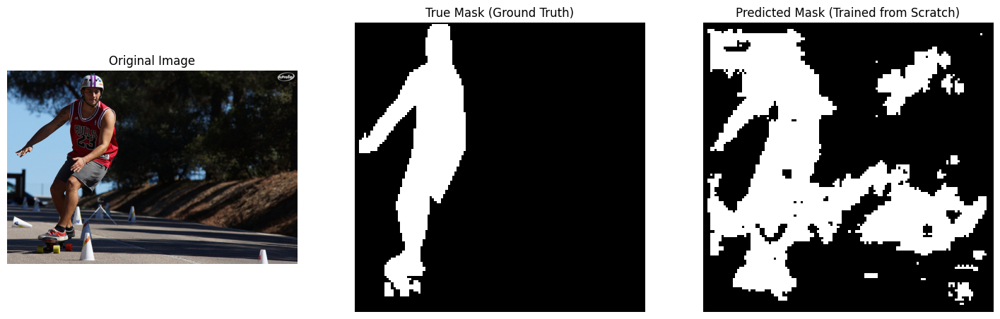

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from pycocotools.coco import COCO
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import time

# --- 0. !!! UPDATE THESE PATHS !!! ---
# Change these paths to point to where your COCO data is on Google Drive
base_drive_path = '/kaggle/input/coco-2017-dataset'
ann_file = os.path.join(base_drive_path, '/kaggle/input/coco-2017-dataset/coco2017/annotations/instances_train2017.json')
img_dir = os.path.join(base_drive_path, '/kaggle/input/coco-2017-dataset/coco2017/train2017/')


# --- 1. CHECK FOR GPU ---
# (Colab needs GPU too! Go to Runtime > Change runtime type > T4 GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Running on device: {device}")

# --- 2. DEFINE A *VERY* SIMPLE MODEL ---
class SimpleSegmenter(nn.Module):
    def __init__(self):
        super(SimpleSegmenter, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)
        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
        self.upconv1 = nn.ConvTranspose2d(32, 16, 2, stride=2)
        self.conv3 = nn.Conv2d(16, 1, 3, padding=1)

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.pool(x)
        x = self.relu(self.conv2(x))
        x = self.relu(self.upconv1(x))
        x = self.conv3(x)
        return x

# --- 3. CREATE A CUSTOM DATASET ---
class CocoTinyDataset(Dataset):
    def __init__(self, coco, img_ids, img_dir, transform, mask_transform):
        self.coco = coco
        self.img_ids = img_ids
        self.img_dir = img_dir
        self.transform = transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        img_id = self.img_ids[idx]
        img_info = self.coco.loadImgs(img_id)[0]
        img_path = os.path.join(self.img_dir, img_info['file_name'])
        image = Image.open(img_path).convert("RGB")

        ann_ids = self.coco.getAnnIds(imgIds=img_info['id'])
        anns = self.coco.loadAnns(ann_ids)

        mask = np.zeros((img_info['height'], img_info['width']))
        for ann in anns:
            mask = np.maximum(self.coco.annToMask(ann), mask)
        mask_pil = Image.fromarray(mask.astype(np.uint8) * 255)

        image_tensor = self.transform(image)
        mask_tensor = self.mask_transform(mask_pil)

        return image_tensor, mask_tensor

# --- 4. PREPARE DATA ---
print("Loading annotations... (This may take 1-2 min)")
try:
    if not os.path.exists(ann_file):
        print(f"---!! ERROR !! ---")
        print(f"File not found at: {ann_file}")
        print("Please update the 'ann_file' variable to the correct path in your Google Drive.")
    else:
        coco = COCO(ann_file)
        print("Annotations loaded.")

        all_img_ids = coco.getImgIds()
        np.random.shuffle(all_img_ids)
        ids_for_demo = all_img_ids[:20000] # Train on only 20 images

        img_size = 128
        data_transform = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])
        mask_transform = transforms.Compose([
            transforms.Resize((img_size, img_size), interpolation=Image.NEAREST),
            transforms.ToTensor(),
        ])

        dataset = CocoTinyDataset(coco, ids_for_demo, img_dir, data_transform, mask_transform)
        dataloader = DataLoader(dataset, batch_size=4, shuffle=True)

        # --- 5. CONFIGURE & RUN TRAINING ---
        model = SimpleSegmenter().to(device)
        criterion = nn.BCEWithLogitsLoss()
        optimizer = optim.Adam(model.parameters(), lr=0.001)

        num_epochs = 15
        print(f"Starting training for {num_epochs} epochs on {len(ids_for_demo)} images...")
        start_time = time.time()
        model.train()
        for epoch in range(num_epochs):
            for images, masks in dataloader:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                loss = criterion(outputs, masks)
                optimizer.zero_grad()
                loss. backward()
                optimizer.step()
            print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
        print(f"Training finished in {time.time() - start_time:.2f} seconds.")

        # --- 6. PREDICT AND PLOT ---
        print("Generating prediction...")
        model.eval()
        test_image_tensor, test_mask_tensor = dataset[0]

        img_id = ids_for_demo[0]
        img_info = coco.loadImgs(img_id)[0]
        img_path = os.path.join(img_dir, img_info['file_name'])
        original_image = Image.open(img_path).convert("RGB")

        with torch.no_grad():
            input_tensor = test_image_tensor.unsqueeze(0).to(device)
            output = model(input_tensor)
            preds_raw = torch.sigmoid(output)
            predicted_mask = (preds_raw > 0.5).cpu().squeeze(0).squeeze(0).numpy()

        # --- 7. DISPLAY THE RESULTS ---
        plt.figure(figsize=(18, 6))
        plt.subplot(1, 3, 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(test_mask_tensor.squeeze(0), cmap='gray')
        plt.title("True Mask (Ground Truth)")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(predicted_mask, cmap='gray')
        plt.title("Predicted Mask (Trained from Scratch)")
        plt.axis('off')

        plt.savefig("segmentation_result_colab.png")
        print("\nSaved plot to segmentation_result_colab.png")

except Exception as e:
    print(f"\nAn error occurred: {e}")
    print("Please check your file paths and ensure you have enabled the GPU (Runtime > Change runtime type).")

In [ ]:
        plt.figure(figsize=(18, 6))
        plt.subplot(1, 3, 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(test_mask_tensor.squeeze(0), cmap='gray')
        plt.title("True Mask (Ground Truth)")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(predicted_mask, cmap='gray')
        plt.title("Predicted Mask (Trained from Scratch)")
        plt.axis('off')

        plt.savefig("segmentation_result_colab.png")
        print("\nSaved plot to segmentation_result_colab.png")


In [ ]:
import matplotlib.pyplot as plt
import os
import torch
from PIL import Image
import numpy as np

# Assuming model, dataset, ids_for_demo, img_dir, data_transform, mask_transform, coco, and device are already defined from previous execution

model.eval()

num_images_to_visualize = 20
print(f"Visualizing {num_images_to_visualize} images...")

# Ensure the output directory exists
output_dir = 'segmentation_visualizations'
os.makedirs(output_dir, exist_ok=True)

for i in range(num_images_to_visualize):
    # Get a new image from the dataset
    img_id = ids_for_demo[i] # Use the i-th image from the demo set
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(img_dir, img_info['file_name'])
    original_image = Image.open(img_path).convert("RGB")

    # Prepare the image and mask using dataset's logic
    image_tensor, true_mask_tensor = dataset[i]

    with torch.no_grad():
        input_tensor = image_tensor.unsqueeze(0).to(device)
        output = model(input_tensor)
        preds_raw = torch.sigmoid(output)
        predicted_mask = (preds_raw > 0.5).cpu().squeeze(0).squeeze(0).numpy()

    # Display the results
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title(f"Original Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(true_mask_tensor.squeeze(0), cmap='gray')
    plt.title(f"True Mask {i+1} (Ground Truth)")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(predicted_mask, cmap='gray')
    plt.title(f"Predicted Mask {i+1}")
    plt.axis('off')

    plot_filename = os.path.join(output_dir, f"segmentation_result_image_{i+1}.png")
    plt.savefig(plot_filename)
    plt.close() # Close the plot to avoid displaying too many figures inline
    print(f"Saved plot for image {i+1} to {plot_filename}")

print(f"\nFinished visualizing {num_images_to_visualize} images. Check the '{output_dir}' directory for the output files.")


Visualizing 20 images...
Saved plot for image 1 to segmentation_visualizations/segmentation_result_image_1.png
Saved plot for image 2 to segmentation_visualizations/segmentation_result_image_2.png
Saved plot for image 3 to segmentation_visualizations/segmentation_result_image_3.png
Saved plot for image 4 to segmentation_visualizations/segmentation_result_image_4.png
Saved plot for image 5 to segmentation_visualizations/segmentation_result_image_5.png
Saved plot for image 6 to segmentation_visualizations/segmentation_result_image_6.png
Saved plot for image 7 to segmentation_visualizations/segmentation_result_image_7.png
Saved plot for image 8 to segmentation_visualizations/segmentation_result_image_8.png
Saved plot for image 9 to segmentation_visualizations/segmentation_result_image_9.png
Saved plot for image 10 to segmentation_visualizations/segmentation_result_image_10.png
Saved plot for image 11 to segmentation_visualizations/segmentation_result_image_11.png
Saved plot for image 12 t

Displaying 20 images from 'segmentation_visualizations':

--- segmentation_result_image_1.png ---


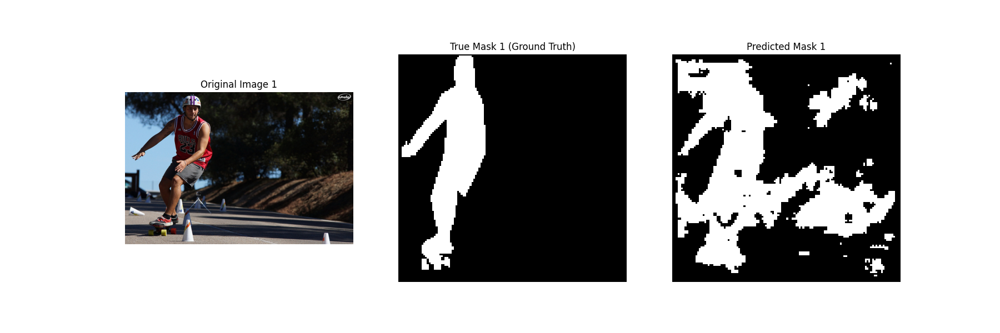


--- segmentation_result_image_10.png ---


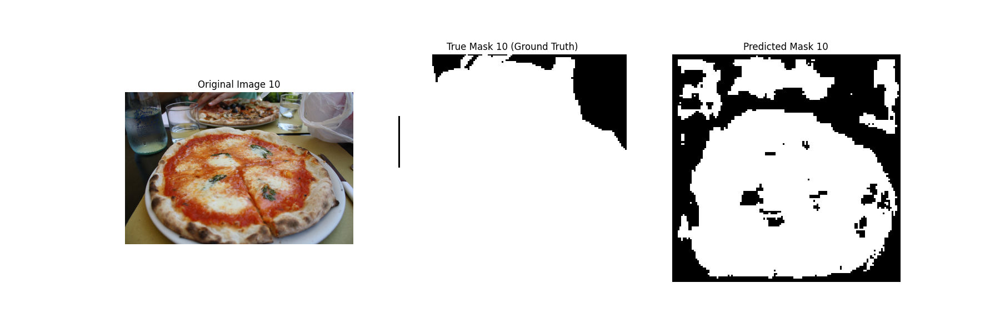


--- segmentation_result_image_11.png ---


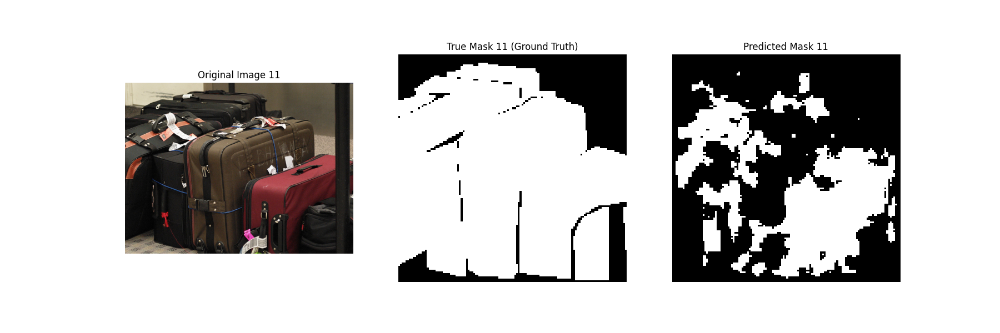


--- segmentation_result_image_12.png ---


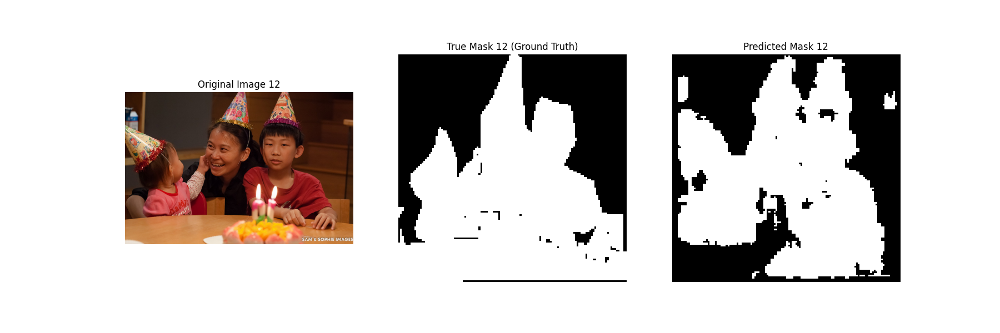


--- segmentation_result_image_13.png ---


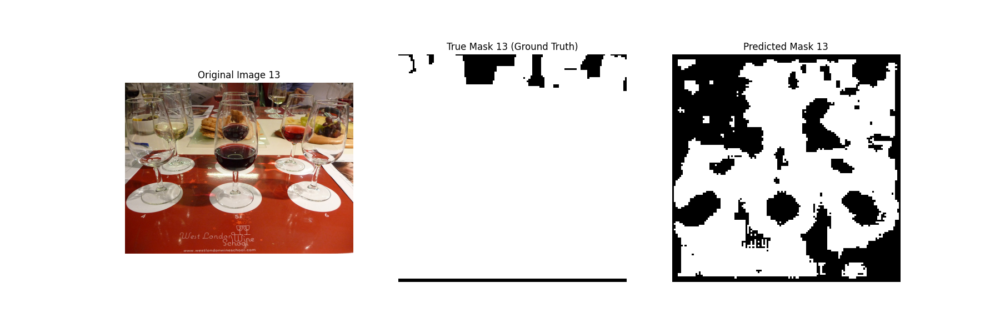


--- segmentation_result_image_14.png ---


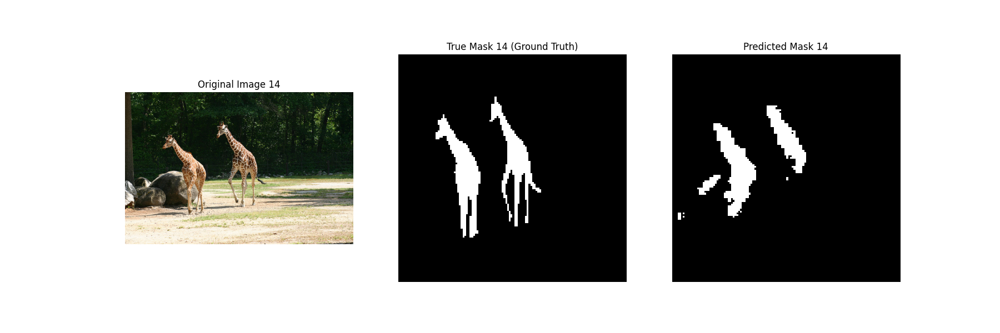


--- segmentation_result_image_15.png ---


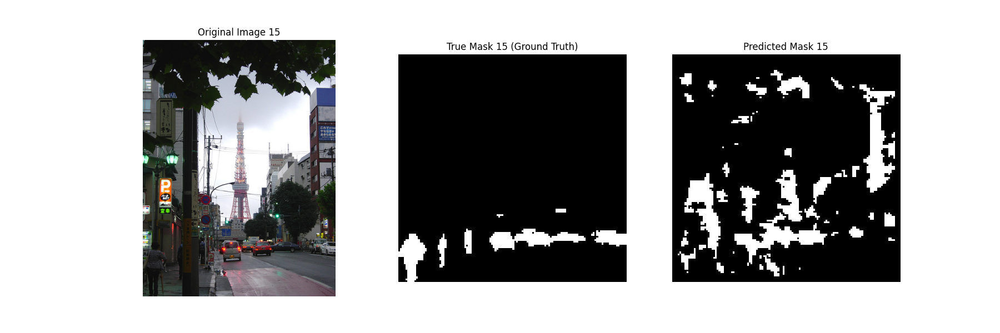


--- segmentation_result_image_16.png ---


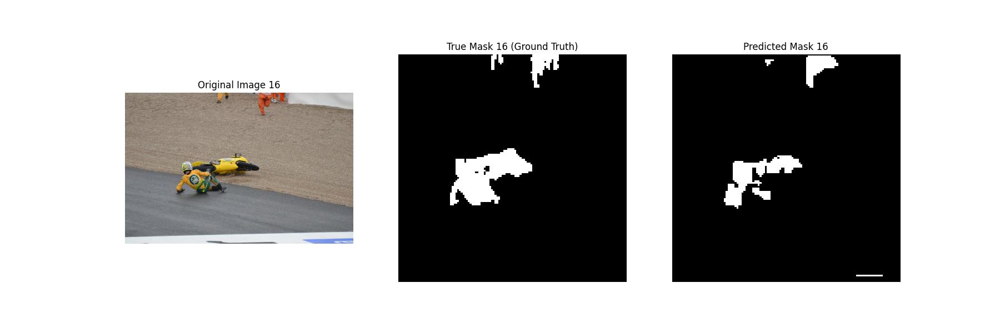


--- segmentation_result_image_17.png ---


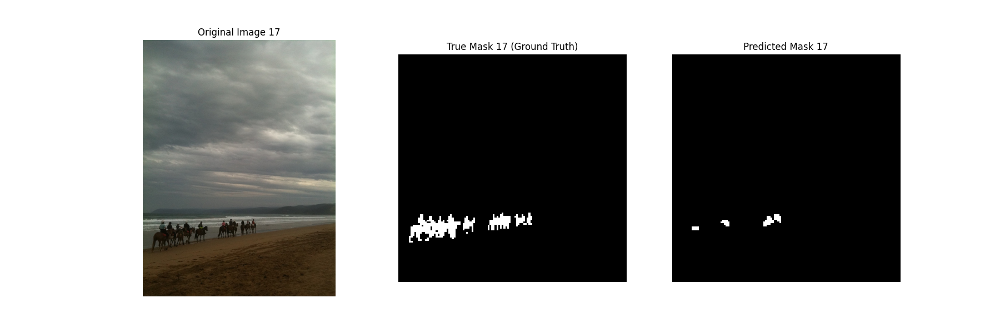


--- segmentation_result_image_18.png ---


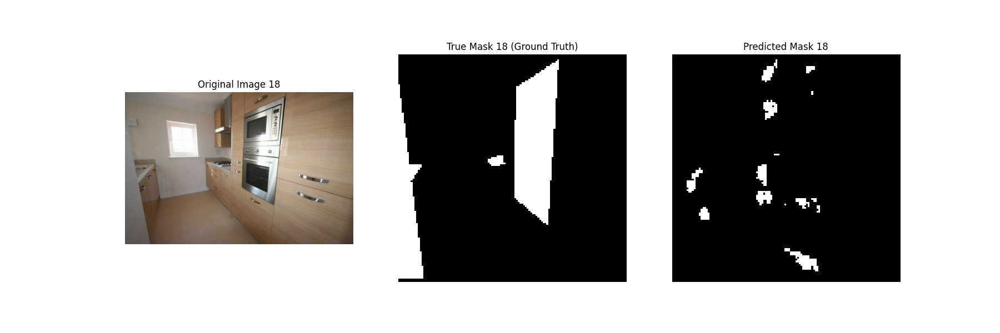


--- segmentation_result_image_19.png ---


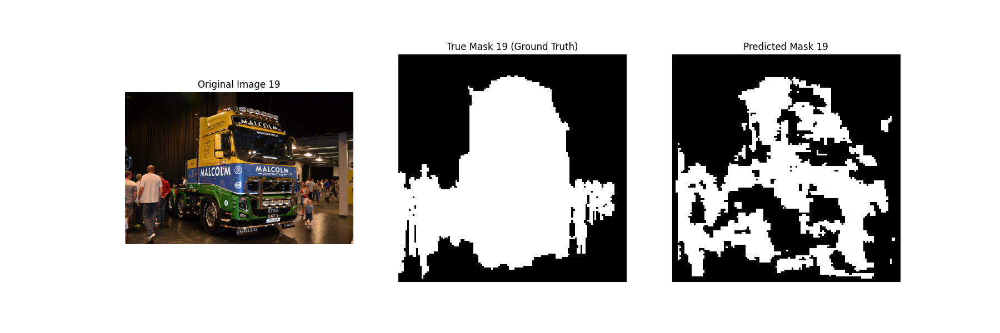


--- segmentation_result_image_2.png ---


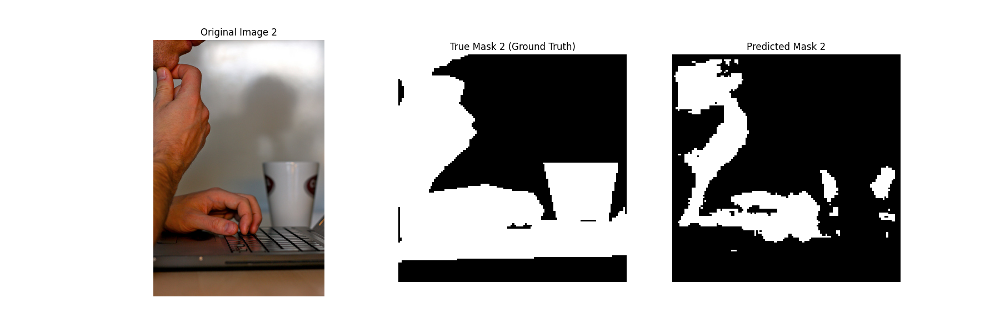


--- segmentation_result_image_20.png ---


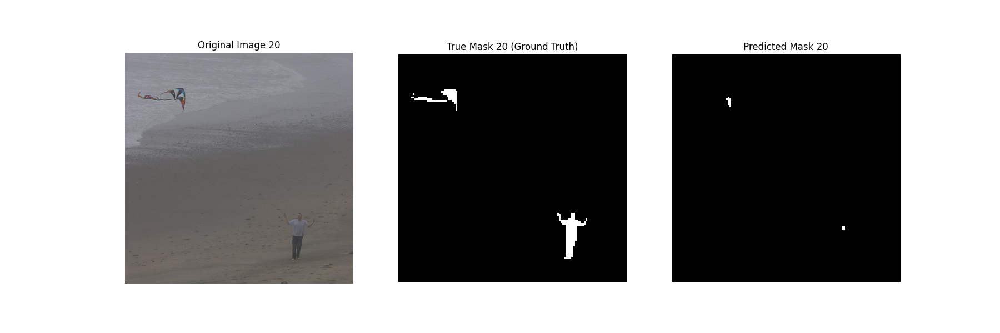


--- segmentation_result_image_3.png ---


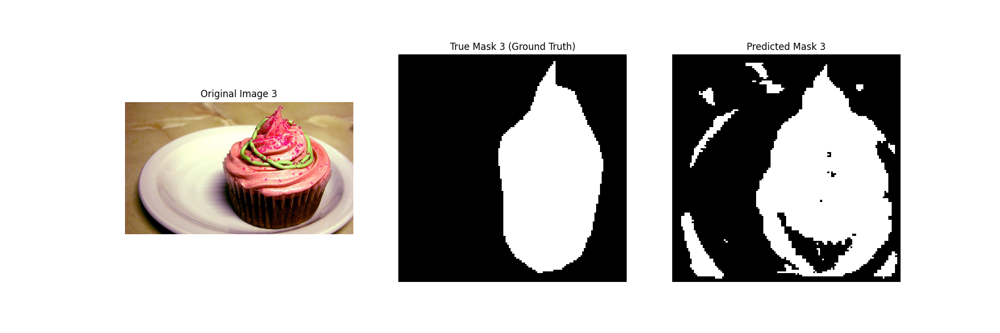


--- segmentation_result_image_4.png ---


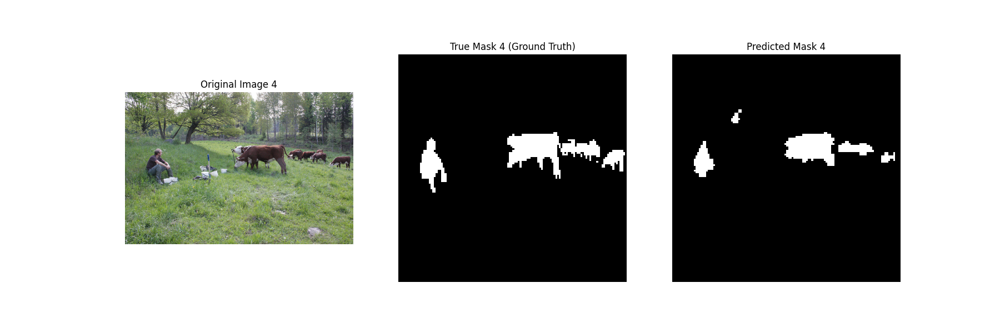


--- segmentation_result_image_5.png ---


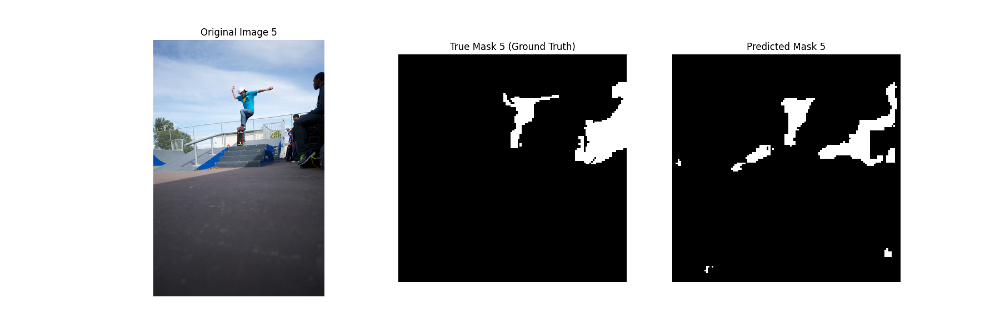


--- segmentation_result_image_6.png ---


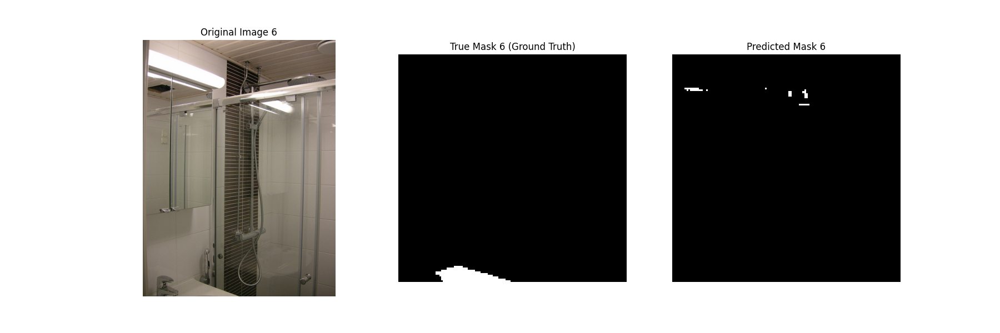


--- segmentation_result_image_7.png ---


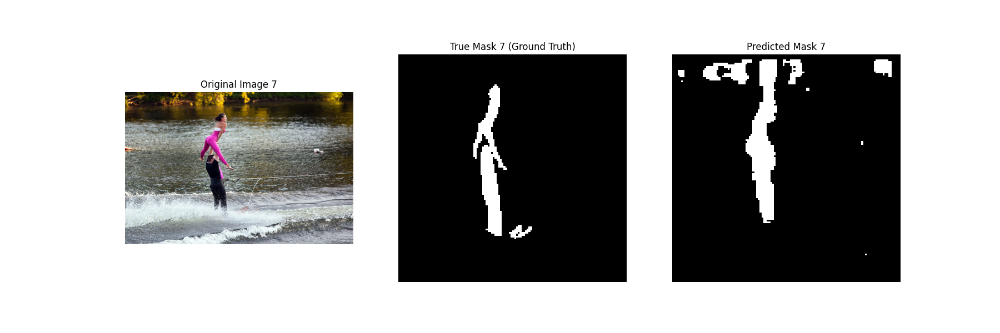


--- segmentation_result_image_8.png ---


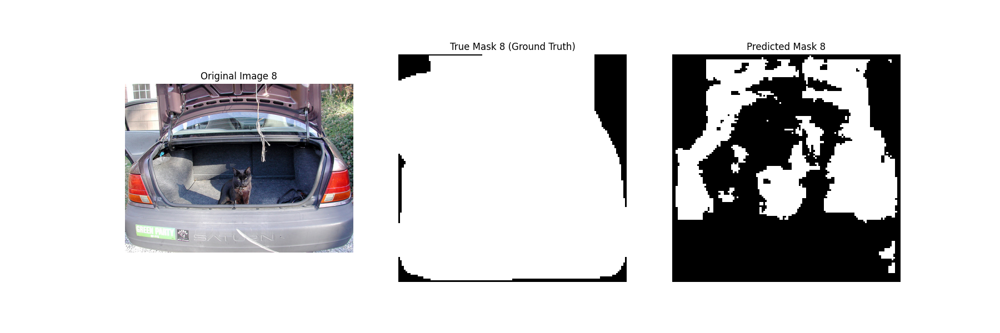


--- segmentation_result_image_9.png ---


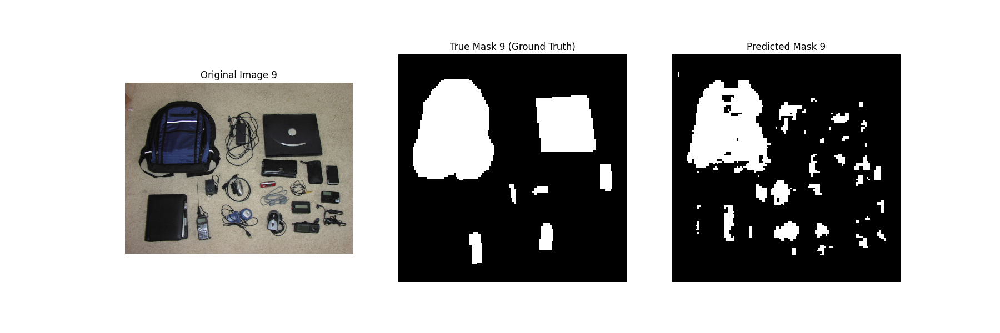

In [ ]:
from IPython.display import Image, display
import os

output_dir = 'segmentation_visualizations'

if os.path.exists(output_dir):
    image_files = sorted([f for f in os.listdir(output_dir) if f.endswith('.png')])
    print(f"Displaying {len(image_files)} images from '{output_dir}':")
    for img_file in image_files:
        file_path = os.path.join(output_dir, img_file)
        print(f"\n--- {img_file} ---")
        display(Image(filename=file_path))
else:
    print(f"The directory '{output_dir}' does not exist. Please ensure the visualization code has been run successfully.")


Running on device: cuda
Loading annotations... (This may take 1-2 min)
loading annotations into memory...
Done (t=16.14s)
creating index...
index created!
Annotations loaded.
Starting training for 15 epochs on 40000 images...
Epoch [1/15], Loss: 0.3535
Epoch [2/15], Loss: 0.6656
Epoch [3/15], Loss: 0.5620
Epoch [4/15], Loss: 0.3335
Epoch [5/15], Loss: 0.4920
Epoch [6/15], Loss: 0.5991
Epoch [7/15], Loss: 0.5010
Epoch [8/15], Loss: 0.6001
Epoch [9/15], Loss: 0.5021
Epoch [10/15], Loss: 0.3478
Epoch [11/15], Loss: 0.6971
Epoch [12/15], Loss: 0.2894
Epoch [13/15], Loss: 0.3769
Epoch [14/15], Loss: 0.3270
Epoch [15/15], Loss: 0.3257
Training finished in 8533.62 seconds.
Generating prediction...

Saved plot to segmentation_result_colab.png


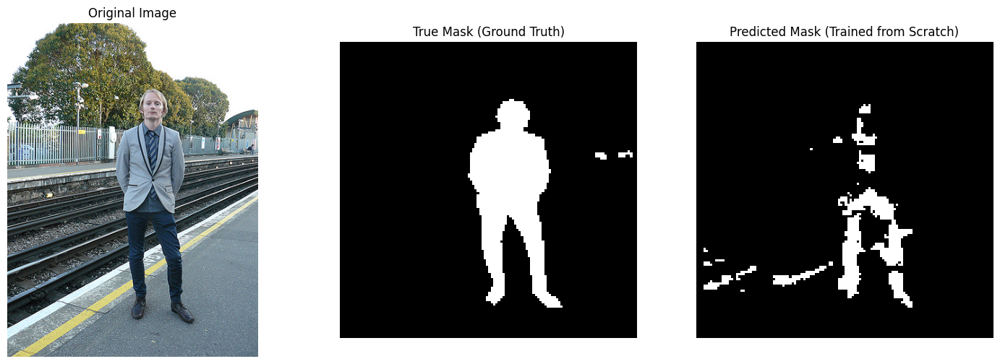

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from pycocotools.coco import COCO
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import time

# --- 0. !!! UPDATE THESE PATHS !!! ---
# Change these paths to point to where your COCO data is on Google Drive
base_drive_path = '/kaggle/input/coco-2017-dataset'
ann_file = os.path.join(base_drive_path, '/kaggle/input/coco-2017-dataset/coco2017/annotations/instances_train2017.json')
img_dir = os.path.join(base_drive_path, '/kaggle/input/coco-2017-dataset/coco2017/train2017/')


# --- 1. CHECK FOR GPU ---
# (Colab needs GPU too! Go to Runtime > Change runtime type > T4 GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Running on device: {device}")

# --- 2. DEFINE A *VERY* SIMPLE MODEL ---
class SimpleSegmenter(nn.Module):
    def __init__(self):
        super(SimpleSegmenter, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)
        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
        self.upconv1 = nn.ConvTranspose2d(32, 16, 2, stride=2)
        self.conv3 = nn.Conv2d(16, 1, 3, padding=1)

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.pool(x)
        x = self.relu(self.conv2(x))
        x = self.relu(self.upconv1(x))
        x = self.conv3(x)
        return x

# --- 3. CREATE A CUSTOM DATASET ---
class CocoTinyDataset(Dataset):
    def __init__(self, coco, img_ids, img_dir, transform, mask_transform):
        self.coco = coco
        self.img_ids = img_ids
        self.img_dir = img_dir
        self.transform = transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        img_id = self.img_ids[idx]
        img_info = self.coco.loadImgs(img_id)[0]
        img_path = os.path.join(self.img_dir, img_info['file_name'])
        image = Image.open(img_path).convert("RGB")

        ann_ids = self.coco.getAnnIds(imgIds=img_info['id'])
        anns = self.coco.loadAnns(ann_ids)

        mask = np.zeros((img_info['height'], img_info['width']))
        for ann in anns:
            mask = np.maximum(self.coco.annToMask(ann), mask)
        mask_pil = Image.fromarray(mask.astype(np.uint8) * 255)

        image_tensor = self.transform(image)
        mask_tensor = self.mask_transform(mask_pil)

        return image_tensor, mask_tensor

# --- 4. PREPARE DATA ---
print("Loading annotations... (This may take 1-2 min)")
try:
    if not os.path.exists(ann_file):
        print(f"---!! ERROR !! ---")
        print(f"File not found at: {ann_file}")
        print("Please update the 'ann_file' variable to the correct path in your Google Drive.")
    else:
        coco = COCO(ann_file)
        print("Annotations loaded.")

        all_img_ids = coco.getImgIds()
        np.random.shuffle(all_img_ids)
        ids_for_demo = all_img_ids[:40000] # Train on only 20 images

        img_size = 128
        data_transform = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])
        mask_transform = transforms.Compose([
            transforms.Resize((img_size, img_size), interpolation=Image.NEAREST),
            transforms.ToTensor(),
        ])

        dataset = CocoTinyDataset(coco, ids_for_demo, img_dir, data_transform, mask_transform)
        dataloader = DataLoader(dataset, batch_size=4, shuffle=True)

        # --- 5. CONFIGURE & RUN TRAINING ---
        model = SimpleSegmenter().to(device)
        criterion = nn.BCEWithLogitsLoss()
        optimizer = optim.Adam(model.parameters(), lr=0.001)

        num_epochs = 15
        print(f"Starting training for {num_epochs} epochs on {len(ids_for_demo)} images...")
        start_time = time.time()
        model.train()
        for epoch in range(num_epochs):
            for images, masks in dataloader:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                loss = criterion(outputs, masks)
                optimizer.zero_grad()
                loss. backward()
                optimizer.step()
            print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
        print(f"Training finished in {time.time() - start_time:.2f} seconds.")

        # --- 6. PREDICT AND PLOT ---
        print("Generating prediction...")
        model.eval()
        test_image_tensor, test_mask_tensor = dataset[0]

        img_id = ids_for_demo[0]
        img_info = coco.loadImgs(img_id)[0]
        img_path = os.path.join(img_dir, img_info['file_name'])
        original_image = Image.open(img_path).convert("RGB")

        with torch.no_grad():
            input_tensor = test_image_tensor.unsqueeze(0).to(device)
            output = model(input_tensor)
            preds_raw = torch.sigmoid(output)
            predicted_mask = (preds_raw > 0.5).cpu().squeeze(0).squeeze(0).numpy()

        # --- 7. DISPLAY THE RESULTS ---
        plt.figure(figsize=(18, 6))
        plt.subplot(1, 3, 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(test_mask_tensor.squeeze(0), cmap='gray')
        plt.title("True Mask (Ground Truth)")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(predicted_mask, cmap='gray')
        plt.title("Predicted Mask (Trained from Scratch)")
        plt.axis('off')

        plt.savefig("segmentation_result_colab.png")
        print("\nSaved plot to segmentation_result_colab.png")

except Exception as e:
    print(f"\nAn error occurred: {e}")
    print("Please check your file paths and ensure you have enabled the GPU (Runtime > Change runtime type).")

In [3]:
import matplotlib.pyplot as plt
import os
import torch
from PIL import Image
import numpy as np

# Assuming model, dataset, ids_for_demo, img_dir, data_transform, mask_transform, coco, and device are already defined from previous execution

model.eval()

num_images_to_visualize = 20
print(f"Visualizing {num_images_to_visualize} images...")

# Ensure the output directory exists
output_dir = 'segmentation_visualizations'
os.makedirs(output_dir, exist_ok=True)

for i in range(num_images_to_visualize):
    # Get a new image from the dataset
    img_id = ids_for_demo[i] # Use the i-th image from the demo set
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(img_dir, img_info['file_name'])
    original_image = Image.open(img_path).convert("RGB")

    # Prepare the image and mask using dataset's logic
    image_tensor, true_mask_tensor = dataset[i]

    with torch.no_grad():
        input_tensor = image_tensor.unsqueeze(0).to(device)
        output = model(input_tensor)
        preds_raw = torch.sigmoid(output)
        predicted_mask = (preds_raw > 0.5).cpu().squeeze(0).squeeze(0).numpy()

    # Display the results
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title(f"Original Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(true_mask_tensor.squeeze(0), cmap='gray')
    plt.title(f"True Mask {i+1} (Ground Truth)")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(predicted_mask, cmap='gray')
    plt.title(f"Predicted Mask {i+1}")
    plt.axis('off')

    plot_filename = os.path.join(output_dir, f"segmentation_result_image_{i+1}.png")
    plt.savefig(plot_filename)
    plt.close() # Close the plot to avoid displaying too many figures inline
    print(f"Saved plot for image {i+1} to {plot_filename}")

print(f"\nFinished visualizing {num_images_to_visualize} images. Check the '{output_dir}' directory for the output files.")


Visualizing 20 images...
Saved plot for image 1 to segmentation_visualizations/segmentation_result_image_1.png
Saved plot for image 2 to segmentation_visualizations/segmentation_result_image_2.png
Saved plot for image 3 to segmentation_visualizations/segmentation_result_image_3.png
Saved plot for image 4 to segmentation_visualizations/segmentation_result_image_4.png
Saved plot for image 5 to segmentation_visualizations/segmentation_result_image_5.png
Saved plot for image 6 to segmentation_visualizations/segmentation_result_image_6.png
Saved plot for image 7 to segmentation_visualizations/segmentation_result_image_7.png
Saved plot for image 8 to segmentation_visualizations/segmentation_result_image_8.png
Saved plot for image 9 to segmentation_visualizations/segmentation_result_image_9.png
Saved plot for image 10 to segmentation_visualizations/segmentation_result_image_10.png
Saved plot for image 11 to segmentation_visualizations/segmentation_result_image_11.png
Saved plot for image 12 t

Displaying 20 images from 'segmentation_visualizations':

--- segmentation_result_image_1.png ---


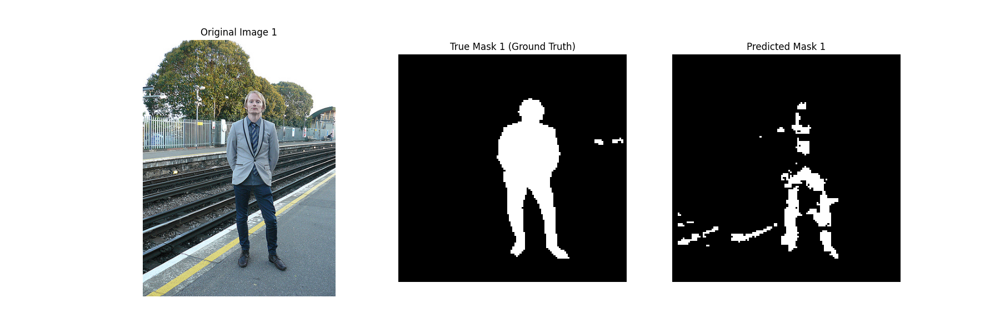


--- segmentation_result_image_10.png ---


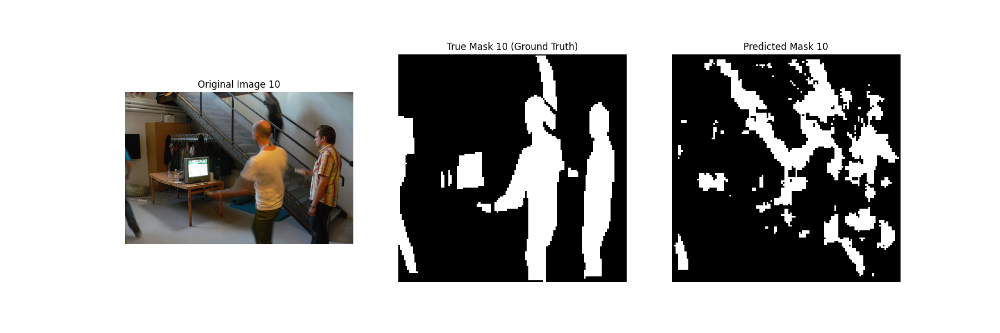


--- segmentation_result_image_11.png ---


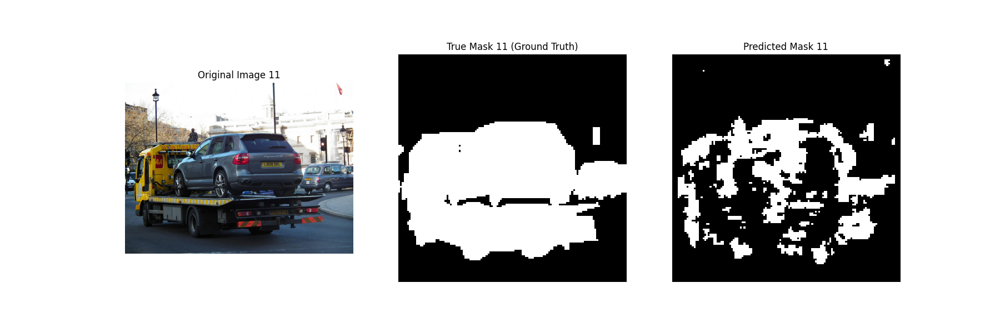


--- segmentation_result_image_12.png ---


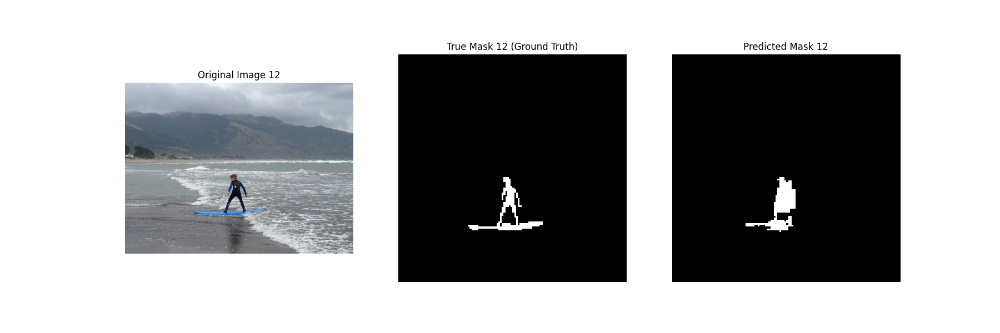


--- segmentation_result_image_13.png ---


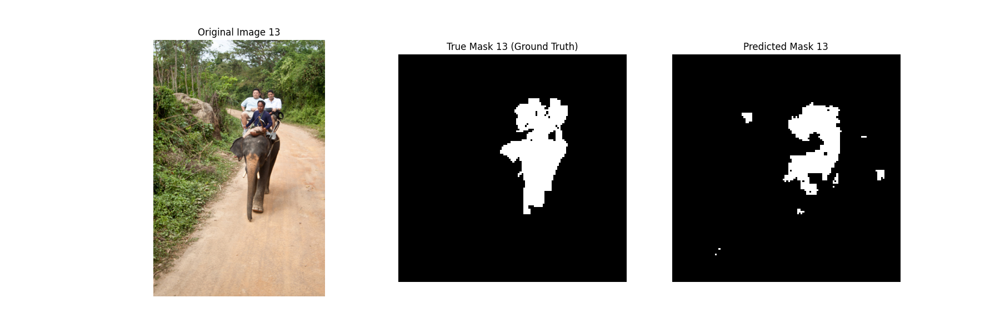


--- segmentation_result_image_14.png ---


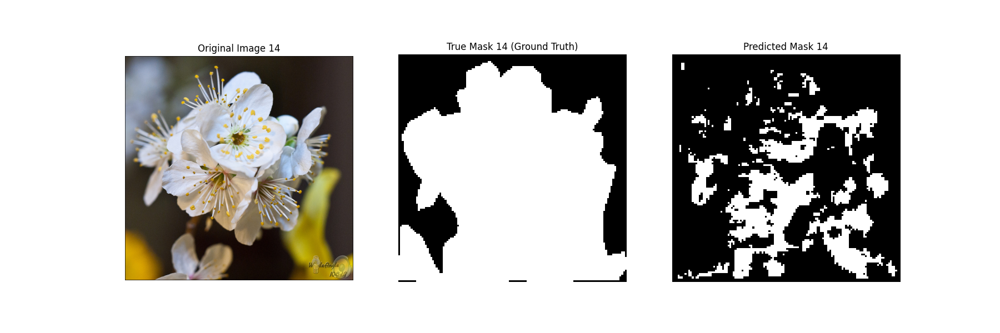


--- segmentation_result_image_15.png ---


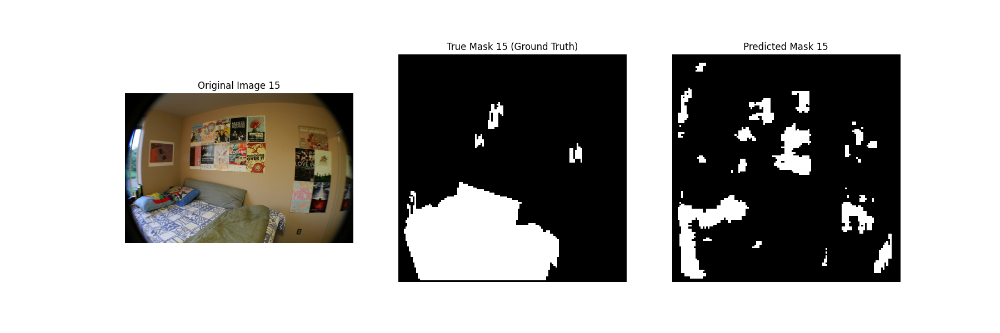


--- segmentation_result_image_16.png ---


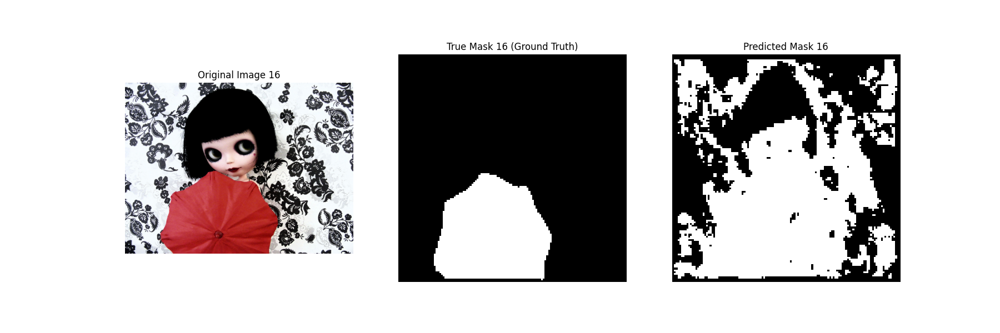


--- segmentation_result_image_17.png ---


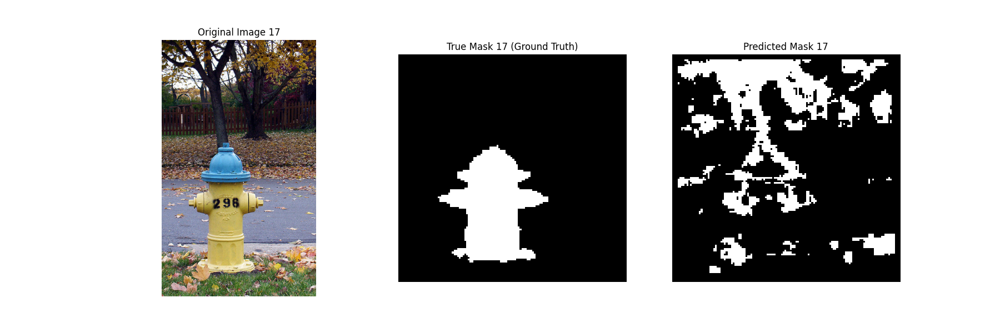


--- segmentation_result_image_18.png ---


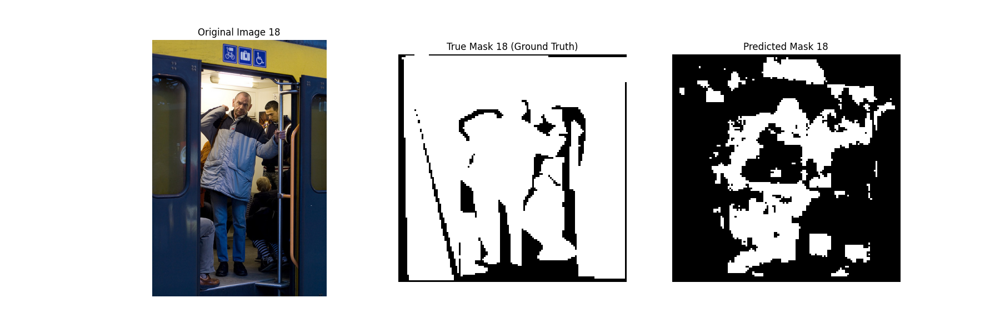


--- segmentation_result_image_19.png ---


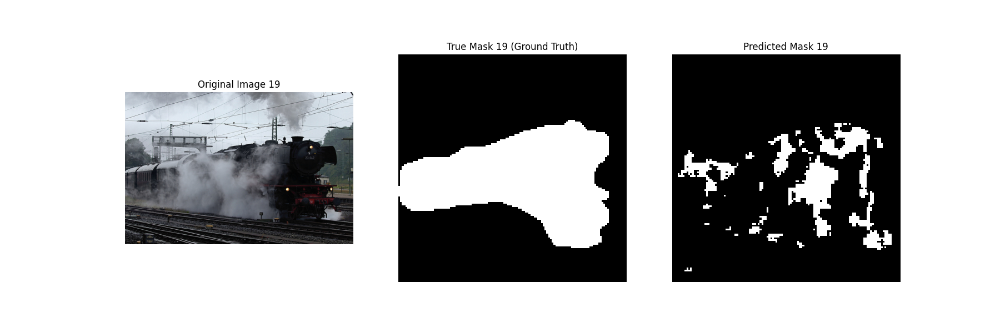


--- segmentation_result_image_2.png ---


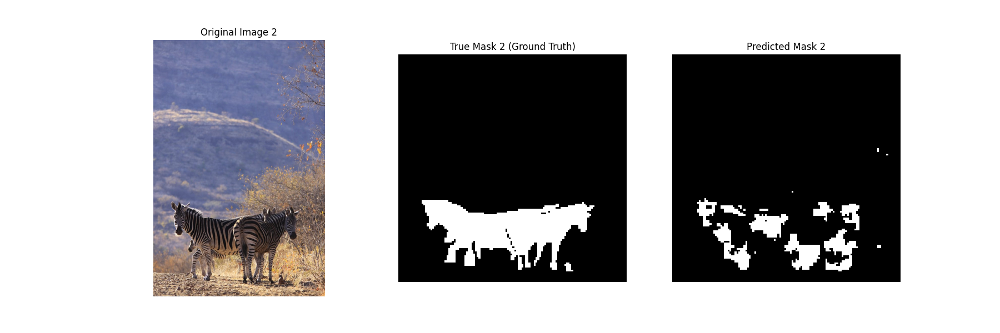


--- segmentation_result_image_20.png ---


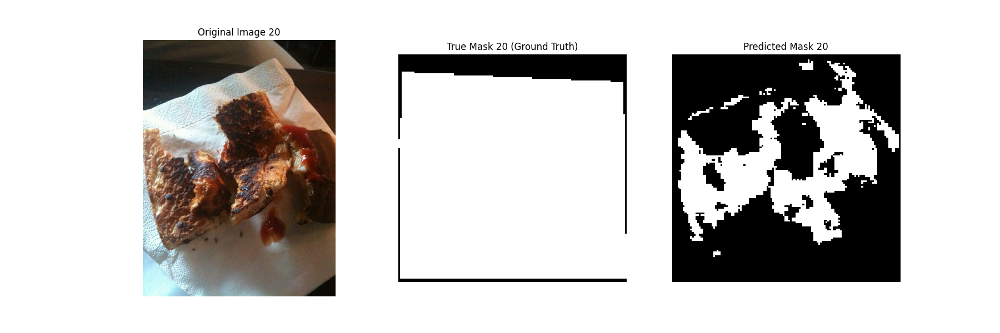


--- segmentation_result_image_3.png ---


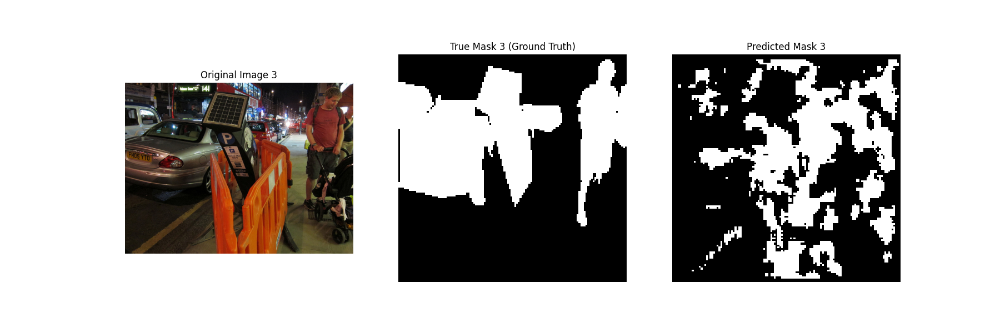


--- segmentation_result_image_4.png ---


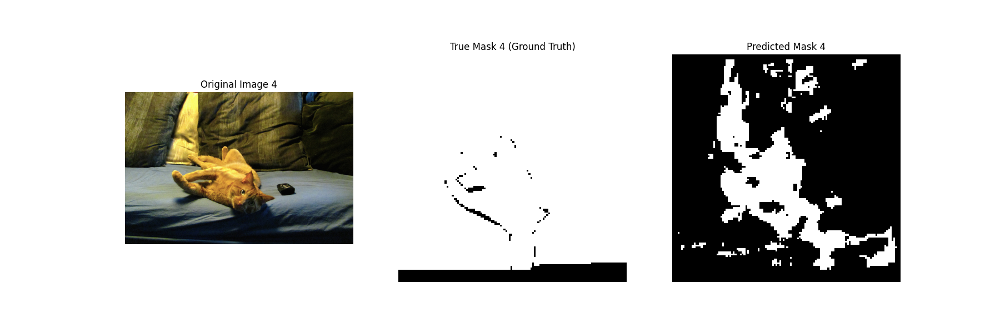


--- segmentation_result_image_5.png ---


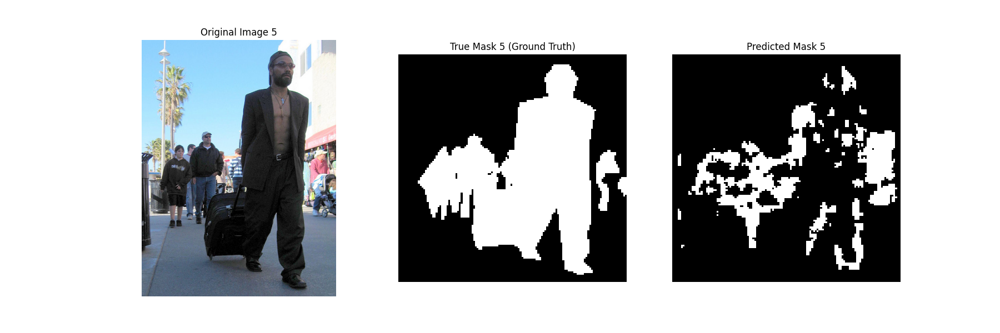


--- segmentation_result_image_6.png ---


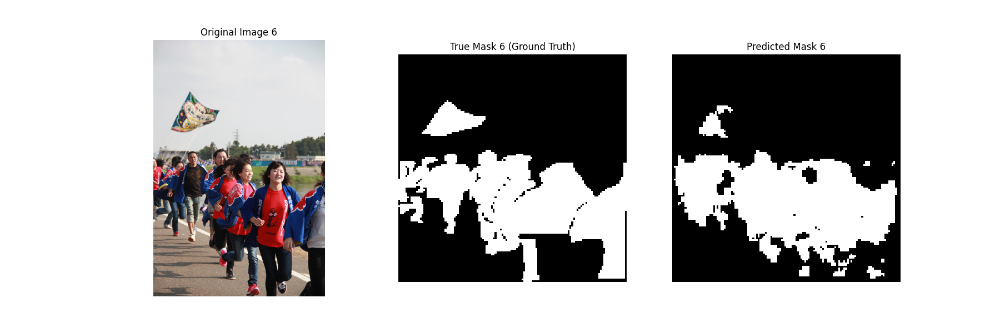


--- segmentation_result_image_7.png ---


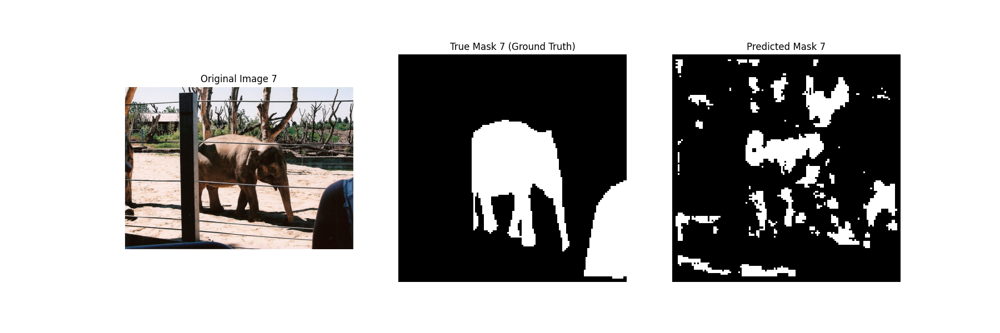


--- segmentation_result_image_8.png ---


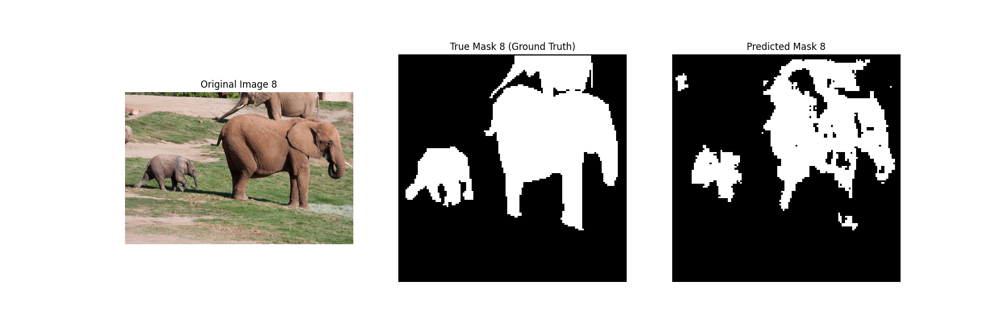


--- segmentation_result_image_9.png ---


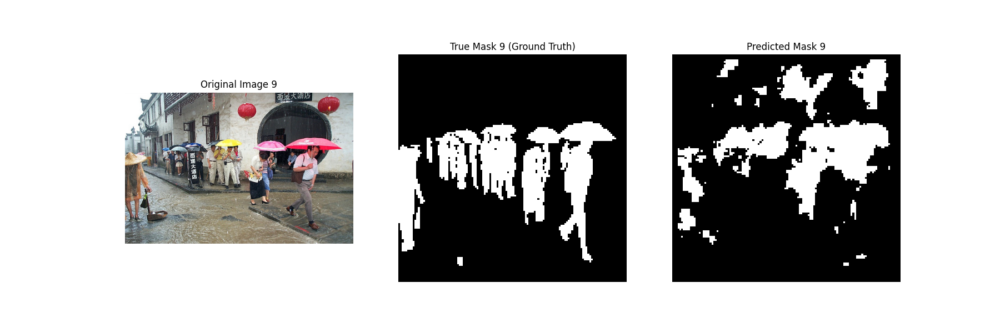

In [4]:
from IPython.display import Image, display
import os

output_dir = 'segmentation_visualizations'

if os.path.exists(output_dir):
    image_files = sorted([f for f in os.listdir(output_dir) if f.endswith('.png')])
    print(f"Displaying {len(image_files)} images from '{output_dir}':")
    for img_file in image_files:
        file_path = os.path.join(output_dir, img_file)
        print(f"\n--- {img_file} ---")
        display(Image(filename=file_path))
else:
    print(f"The directory '{output_dir}' does not exist. Please ensure the visualization code has been run successfully.")
